In [1]:
import tensorflow as tf; print(tf.__version__)

2.10.1


In [44]:
pip install pygame

     --------------------------------------- 10.8/10.8 MB 34.4 MB/s eta 0:00:00
Note: you may need to restart the kernel to use updated packages.


In [55]:
# Проверка доступных устройств
devices = tf.config.list_physical_devices()
for device in devices:
    print(device)

PhysicalDevice(name='/physical_device:CPU:0', device_type='CPU')
PhysicalDevice(name='/physical_device:GPU:0', device_type='GPU')


In [56]:
tf.debugging.set_log_device_placement(True)

In [8]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

image_folder = 'flower_photos'

# Создаем генератор данных
datagen = ImageDataGenerator(rescale=1./255, validation_split=0.2,
                            rotation_range=20,
                            width_shift_range=0.2,
                            height_shift_range=0.2,
                            horizontal_flip=True,
                            vertical_flip=True,
                            zoom_range=0.2,
                            shear_range=0.2,
                            fill_mode='nearest'
                            )

# Загружаем данные и разделяем их на обучающий и тестовый наборы
train_generator = datagen.flow_from_directory(
    image_folder,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    subset='training')

test_generator = datagen.flow_from_directory(
    image_folder,
    target_size=(256, 256),
    batch_size=32,
    class_mode='categorical',
    subset='validation')

Found 2939 images belonging to 5 classes.
Found 731 images belonging to 5 classes.


In [24]:
batch_size = train_generator.batch_size
def check_model_fit_in_gpu(model, batch_size):
    # Создаем dummy input
    dummy_input = tf.random.normal((batch_size,) + model.input_shape[1:])
    
    try:
        # Пытаемся пропустить dummy input через модель
        model(dummy_input)
        print("Модель помещается в видеопамять.")
        return True
    except tf.errors.ResourceExhaustedError:
        print("Модель не помещается в видеопамять.")
        return False
    
check_model_fit_in_gpu(model, batch_size)

Модель помещается в видеопамять.


True

In [25]:
try:
    dummy_batch = next(train_generator)
    # Проверяем, поместится ли батч в видеопамять
    model(dummy_batch[0])
    print("Модель помещается в видеопамять.")
except tf.errors.ResourceExhaustedError:
    print("Модель не помещается в видеопамять.")

Модель помещается в видеопамять.


In [4]:
# Проверяем размеры генераторов
print('Размер обучающего набора:', len(train_generator))
print('Размер тестового набора:', len(test_generator))

# Получаем первый батч из обучающего набора
for data_batch, labels_batch in train_generator:
    print('Размер батча данных:', data_batch.shape)
    print('Размер батча меток:', labels_batch.shape)
    break

Размер обучающего набора: 74
Размер тестового набора: 19
Размер батча данных: (64, 256, 256, 3)
Размер батча меток: (64, 2)


C:\Users\Normist\anaconda3\lib\site-packages\matplotlib\text.py:1223: FutureWarning: elementwise comparison failed; returning scalar instead, but in the future will perform elementwise comparison
  if s != self._text:


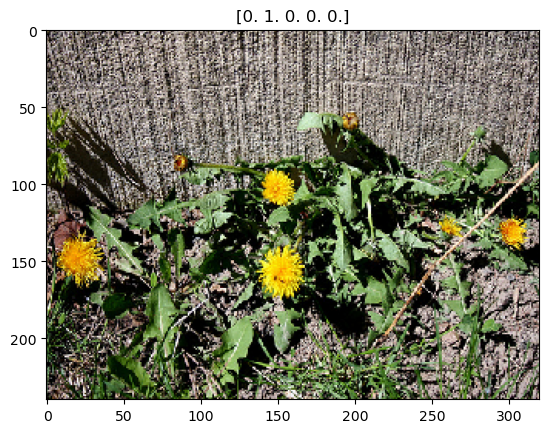

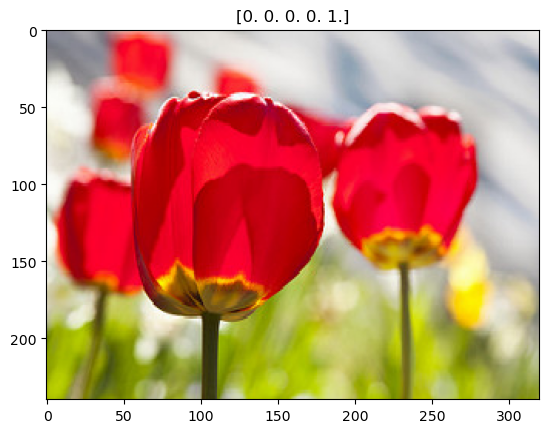

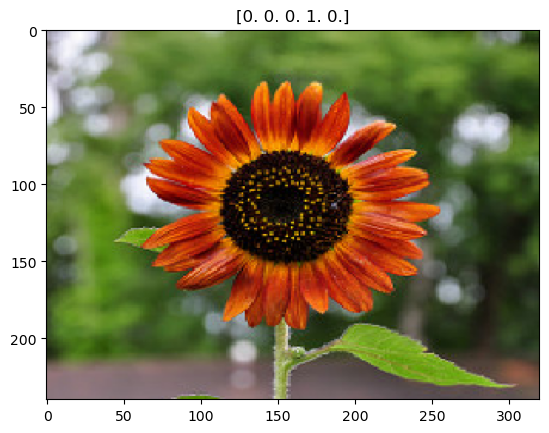

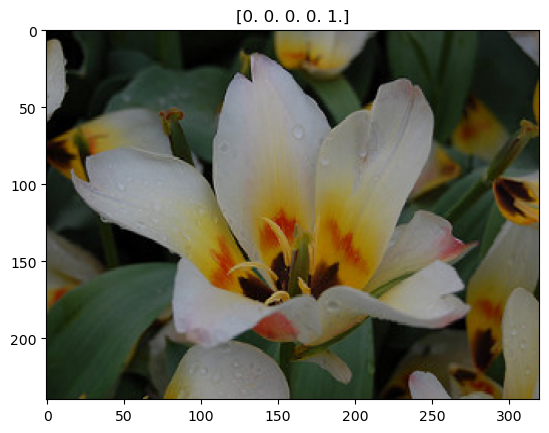

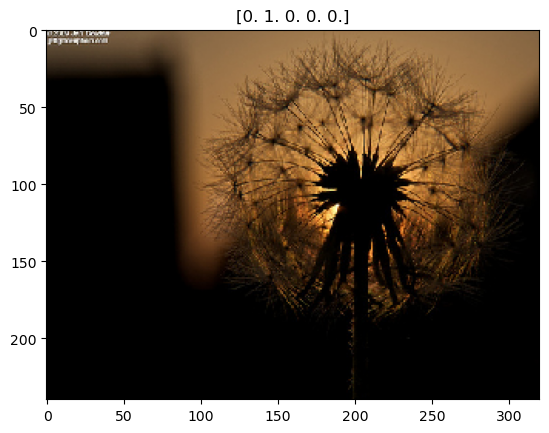

...

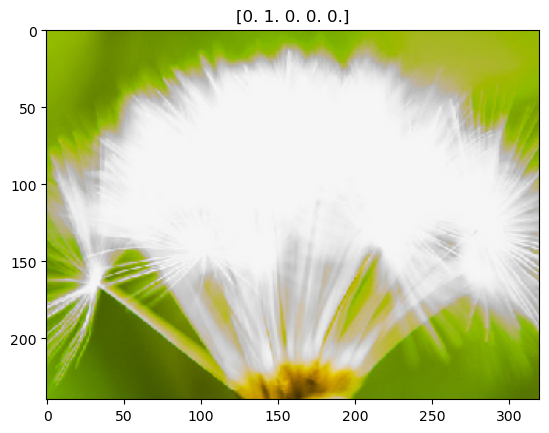

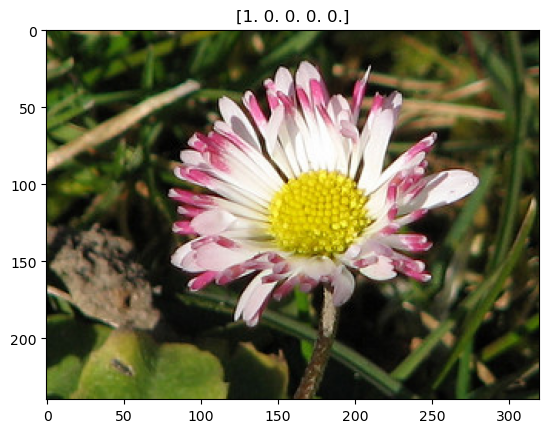

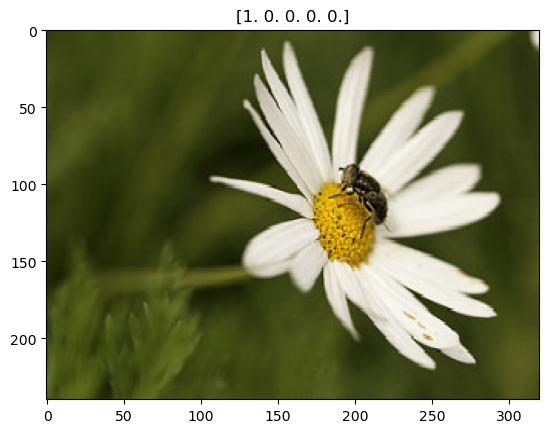

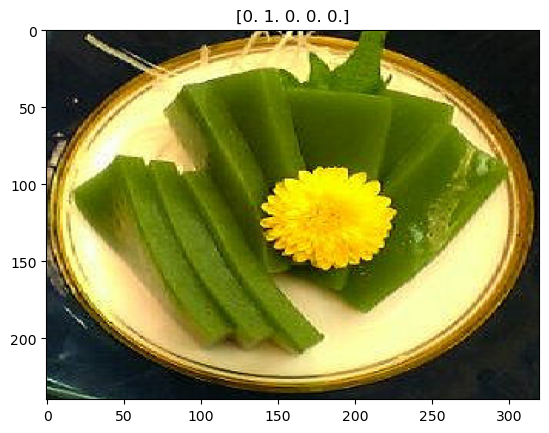

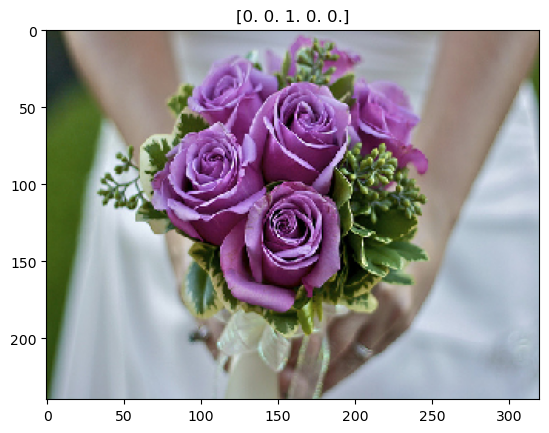

In [40]:
import matplotlib.pyplot as plt

# Получаем первый батч из генератора
images, labels = next(train_generator)

for image, label in zip(images, labels):
    plt.imshow(image)
    plt.title(label)
    plt.show()

In [97]:
import tensorflow as tf
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout

# Архитектура свёрточной нейронной сети
model = Sequential([
    # Первый блок свёрточных слоёв
    Conv2D(32, (3, 3), activation='relu', input_shape=(240, 320, 3)),
    MaxPooling2D((2, 2)),
    Conv2D(64, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),
    Conv2D(128, (3, 3), activation='relu'),
    MaxPooling2D((2, 2)),

    # Слой преобразования данных из 2D представления в плоский вектор
    Flatten(),

    # Полносвязные слои
    Dense(512, activation='relu'),
    Dropout(0.5),  # Используем дропаут для регуляризации
    Dense(4, activation='softmax')  # 4 класса клеток
])

# Компиляция модели
model.compile(optimizer='adam',
              loss='categorical_crossentropy',
              metrics=['accuracy'])

# Вывод информации о модели
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_189 (Conv2D)         (None, 238, 318, 32)      896       
                                                                 
 max_pooling2d_80 (MaxPoolin  (None, 119, 159, 32)     0         
 g2D)                                                            
                                                                 
 conv2d_190 (Conv2D)         (None, 117, 157, 64)      18496     
                                                                 
 max_pooling2d_81 (MaxPoolin  (None, 58, 78, 64)       0         
 g2D)                                                            
                                                                 
 conv2d_191 (Conv2D)         (None, 56, 76, 128)       73856     
                                                                 
 max_pooling2d_82 (MaxPoolin  (None, 28, 38, 128)     

In [16]:
from tensorflow.keras import datasets, layers, models, regularizers
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, AveragePooling2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

# Создание модели
name = 'something'
model = Sequential(name=name)

# Добавление слоев
model.add(Conv2D(64, (3, 3), (1, 1), activation='relu', input_shape=(256, 256, 3)))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(4, 4)))

model.add(Conv2D(64, (3, 3), (1, 1), activation='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), (1, 1), activation='relu'))
model.add(BatchNormalization())
model.add(AveragePooling2D(pool_size=(2, 2)))

model.add(Flatten())

model.add(Dense(64, activation='relu'))
model.add(Dense(10, activation='relu'))
model.add(Dense(5, activation='softmax'))

# Компиляция модели
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Вывод информации о модели
model.summary()

Model: "new"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_10 (Conv2D)          (None, 254, 254, 64)      1792      
                                                                 
 batch_normalization_10 (Bat  (None, 254, 254, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_6 (MaxPooling  (None, 63, 63, 64)       0         
 2D)                                                             
                                                                 
 conv2d_11 (Conv2D)          (None, 61, 61, 64)        36928     
                                                                 
 batch_normalization_11 (Bat  (None, 61, 61, 64)       256       
 chNormalization)                                                
                                                               

In [26]:
from tensorflow.keras import datasets, layers, models, regularizers

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, AveragePooling2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization

# Создание модели
name = 'my_model_like_vgg-16_cells_15M_2X_Batch64'
model = Sequential(name=name)

# Добавление слоев
model.add(Conv2D(64, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(64, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(128, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(128, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(256, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(256, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(256, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(512, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(512, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(512, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(512, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(512, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(Conv2D(512, (3, 3), (1, 1), activation='relu', input_shape=(240, 320, 3), padding='valid'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())

model.add(Dense(256, activation='relu'))
# model.add(Dropout(0.5))

model.add(Dense(256, activation='relu'))

model.add(Dense(4, activation='softmax'))

# Компиляция модели
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

# Вывод информации о модели
model.summary()

Model: "my_model_like_vgg-16_cells_15M_2X_Batch64"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_56 (Conv2D)          (None, 238, 318, 64)      1792      
                                                                 
 batch_normalization_56 (Bat  (None, 238, 318, 64)     256       
 chNormalization)                                                
                                                                 
 conv2d_57 (Conv2D)          (None, 236, 316, 64)      36928     
                                                                 
 batch_normalization_57 (Bat  (None, 236, 316, 64)     256       
 chNormalization)                                                
                                                                 
 max_pooling2d_21 (MaxPoolin  (None, 118, 158, 64)     0         
 g2D)                                                            
                         

In [65]:
model = models.load_model('saved_model/my_modelV2_830_x2')
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])

In [17]:
import time
start_time = time.time() # засекаем время

history = model.fit( # обучаем модель и сохраняем историю обучения в переменную
    train_generator,
    steps_per_epoch=train_generator.samples // train_generator.batch_size,
    epochs=20,
    validation_data=test_generator,
    validation_steps=test_generator.samples // test_generator.batch_size)

end_time = time.time()
training_time = end_time - start_time
print(f"Время обучения: {training_time} секунд")

import pygame # Звук окончания обучения
pygame.init()
sound = pygame.mixer.Sound('ha.mp3')
sound.play()
while pygame.mixer.get_busy():
    pygame.time.Clock().tick(10)
pygame.quit()

Epoch 1/20
91/91 [==============================] - 11s 111ms/step - loss: 1.6721 - accuracy: 0.4142 - val_loss: 1.6038 - val_accuracy: 0.2557
Epoch 2/20
91/91 [==============================] - 10s 105ms/step - loss: 1.3313 - accuracy: 0.4912 - val_loss: 1.6057 - val_accuracy: 0.2472
Epoch 3/20
91/91 [==============================] - 10s 109ms/step - loss: 1.2379 - accuracy: 0.5029 - val_loss: 1.5586 - val_accuracy: 0.3097
Epoch 4/20
91/91 [==============================] - 10s 114ms/step - loss: 1.1758 - accuracy: 0.5215 - val_loss: 1.5185 - val_accuracy: 0.3139
Epoch 5/20
91/91 [==============================] - 10s 114ms/step - loss: 1.1858 - accuracy: 0.5335 - val_loss: 1.3138 - val_accuracy: 0.4616
Epoch 6/20
91/91 [==============================] - 10s 114ms/step - loss: 1.1136 - accuracy: 0.5497 - val_loss: 1.3184 - val_accuracy: 0.4517
Epoch 7/20
91/91 [==============================] - 10s 115ms/step - loss: 1.0321 - accuracy: 0.5703 - val_loss: 1.3114 - val_accuracy: 0.5213

In [11]:
model.save(f'saved_model/{name}') #Сохранение модели

import pickle
# Сохранение истории обучения в файл
with open(f'saved_history/{len(history.epoch)}_epoch_history_{name}.pkl', 'wb') as file:
    pickle.dump(history.history, file)
# Сохраним время
with open(f'training_time/time_{len(history.epoch)}_epoch_{name}.pkl', 'wb') as file:
    pickle.dump(training_time, file)

INFO:tensorflow:Assets written to: saved_model/new\assets


INFO:tensorflow:Assets written to: saved_model/new\assets


In [87]:
# Ручной ввод эпох
# Сохранение истории обучения в файл
with open(f'saved_history/40_epoch_history_{name}.pkl', 'wb') as file:
    pickle.dump(history.history, file)
# Сохраним время
with open(f'training_time/time_40_epoch_{name}.pkl', 'wb') as file:
    pickle.dump(training_time, file)

In [12]:
# Загрузка истории обучения из файла
with open(f'saved_history/{len(history.epoch)}_epoch_history_{name}.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

In [88]:
# Ручной ввод эпох
with open(f'saved_history/40_epoch_history_{name}.pkl', 'rb') as file:
    loaded_history = pickle.load(file)

Text(0.5, 1.0, 'Loss Curves')

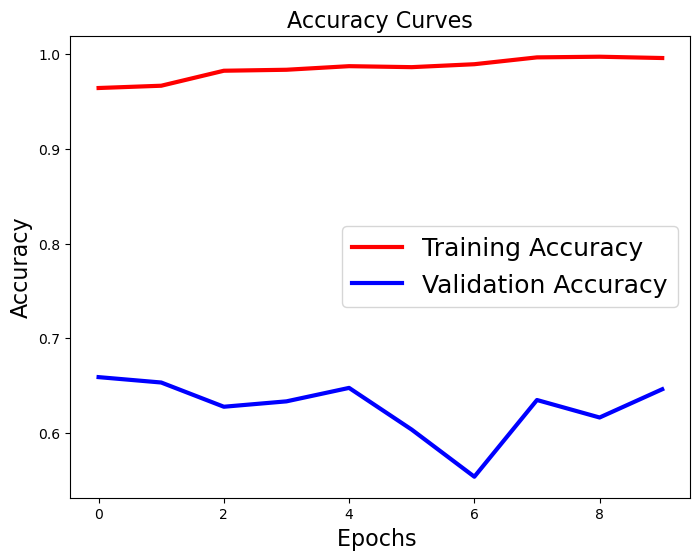

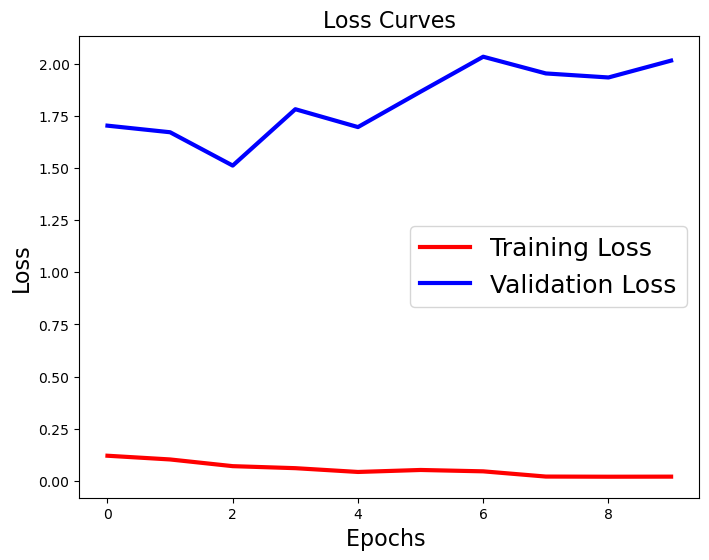

In [13]:
import matplotlib.pyplot as plt

# График accuracy и epoch
plt.figure(figsize=[8,6])
plt.plot(loaded_history['accuracy'], 'r', linewidth=3.0)
plt.plot(loaded_history['val_accuracy'], 'b', linewidth=3.0)
plt.legend(['Training Accuracy', 'Validation Accuracy'], fontsize=18)
plt.xlabel('Epochs ', fontsize=16)
plt.ylabel('Accuracy', fontsize=16)
plt.title('Accuracy Curves', fontsize=16)

# График loss и epoch
plt.figure(figsize=[8,6])
plt.plot(loaded_history['loss'], 'r', linewidth=3.0)
plt.plot(loaded_history['val_loss'], 'b', linewidth=3.0)
plt.legend(['Training Loss', 'Validation Loss'], fontsize=18)
plt.xlabel('Epochs ', fontsize=16)
plt.ylabel('Loss', fontsize=16)
plt.title('Loss Curves', fontsize=16)

In [3]:
pip install pyyaml h5py

Note: you may need to restart the kernel to use updated packages.
